In [3]:
import visual_behavior_glm.GLM_visualization_tools as gvt
import visual_behavior_glm.GLM_analysis_tools as gat
import pandas as pd
import visual_behavior.data_access.loading as loading
import matplotlib.pyplot as plt
import numpy as np

pd.set_option('display.max_columns', 500)

In [4]:
%matplotlib inline
%widescreen

applied a custom magic command to make full use of screen width
will only work if command is defined locally
replace with the following to replicate functionality: 
	from IPython.core.display import display, HTML
	display(HTML("<style>.container { width:100% !important; }</style>")


In [10]:
experiment_table = loading.get_filtered_ophys_experiment_table().reset_index()

In [11]:
experiment_table

,ophys_experiment_id,ophys_session_id,behavior_session_id,container_id,project_code,container_workflow_state,experiment_workflow_state,session_name,session_type,equipment_name,date_of_acquisition,isi_experiment_id,specimen_id,sex,age_in_days,full_genotype,reporter_line,driver_line,imaging_depth,targeted_structure,published_at,super_container_id,cre_line,session_tags,failure_tags,exposure_number,model_outputs_available,location,has_events,session_number
0,953659745,952430817,952554548,1018028339,VisualBehaviorMultiscope,completed,passed,20190923_457841_2imagesA,OPHYS_2_images_A_passive,MESO.1,2019-09-23 08:13:07.627573,858992726,850862430,F,209.0,Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,['Ai148(TIT2L-GC6f-ICL-tTA2)'],['Sst-IRES-Cre'],75,VISp,NaN,850862430,Sst-IRES-Cre,NaN,"z_drift_corr_um_diff,z_drift_corr_um_diff,z_dr...",0,False,Sst_VISp_75,True,2
1,953659749,952430817,952554548,1018028354,VisualBehaviorMultiscope,completed,passed,20190923_457841_2imagesA,OPHYS_2_images_A_passive,MESO.1,2019-09-23 08:13:07.627573,858992726,850862430,F,209.0,Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,['Ai148(TIT2L-GC6f-ICL-tTA2)'],['Sst-IRES-Cre'],150,VISl,NaN,850862430,Sst-IRES-Cre,NaN,"z_drift_corr_um_diff,z_drift_corr_um_diff,z_dr...",0,False,Sst_VISl_150,True,2
2,953659752,952430817,952554548,1018028357,VisualBehaviorMultiscope,completed,passed,20190923_457841_2imagesA,OPHYS_2_images_A_passive,MESO.1,2019-09-23 08:13:07.627573,858992726,850862430,F,209.0,Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,['Ai148(TIT2L-GC6f-ICL-tTA2)'],['Sst-IRES-Cre'],225,VISl,NaN,850862430,Sst-IRES-Cre,NaN,"z_drift_corr_um_diff,z_drift_corr_um_diff,z_dr...",0,False,Sst_VISl_225,True,2
3,953659743,952430817,952554548,1018028345,VisualBehaviorMultiscope,completed,passed,20190923_457841_2imagesA,OPHYS_2_images_A_passive,MESO.1,2019-09-23 08:13:07.627573,858992726,850862430,F,209.0,Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,['Ai148(TIT2L-GC6f-ICL-tTA2)'],['Sst-IRES-Cre'],225,VISp,NaN,850862430,Sst-IRES-Cre,NaN,"z_drift_corr_um_diff,z_drift_corr_um_diff,z_dr...",0,False,Sst_VISp_225,True,2
4,958527474,954954402,953982960,1018028339,VisualBehaviorMultiscope,completed,passed,20190924_457841_3imagesA,OPHYS_3_images_A,MESO.1,2019-09-24 16:00:00.000000,858992726,850862430,F,210.0,Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,['Ai148(TIT2L-GC6f-ICL-tTA2)'],['Sst-IRES-Cre'],75,VISp,NaN,850862430,Sst-IRES-Cre,NaN,NaN,0,True,Sst_VISp_75,True,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1413,901559828,900802327,901251663,895259496,VisualBehaviorTask1B,container_qc,passed,20190708_461946_3imagesB,OPHYS_3_images_B,CAM2P.5,2019-07-08 16:09:58.000000,872873989,862671211,F,111.0,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-G...,['Ai93(TITL-GCaMP6f)'],"['Camk2a-tTA', 'Slc17a7-IRES2-Cre']",175,VISp,NaN,862671211,Slc17a7-IRES2-Cre,NaN,NaN,0,True,Slc17a7_VISp_175,False,3
1414,902487182,901759468,902135840,895259496,VisualBehaviorTask1B,container_qc,passed,20190709_461946_2imagesB,OPHYS_2_images_B_passive,CAM2P.5,2019-07-09 15:42:29.000000,872873989,862671211,F,112.0,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-G...,['Ai93(TITL-GCaMP6f)'],"['Camk2a-tTA', 'Slc17a7-IRES2-Cre']",175,VISp,NaN,862671211,Slc17a7-IRES2-Cre,NaN,NaN,0,False,Slc17a7_VISp_175,False,2
1415,903405627,902777219,902871565,895259496,VisualBehaviorTask1B,container_qc,passed,20190710_461946_4imagesA,OPHYS_4_images_A,CAM2P.5,2019-07-10 17:19:50.000000,872873989,862671211,F,113.0,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-G...,['Ai93(TITL-GCaMP6f)'],"['Camk2a-tTA', 'Slc17a7-IRES2-Cre']",175,VISp,NaN,862671211,Slc17a7-IRES2-Cre,NaN,NaN,0,True,Slc17a7_VISp_175,False,4
1416,904155155,903711544,903842232,895259496,VisualBehaviorTask1B,container_qc,passed,20190711_461946_5imagesApassive,OPHYS_5_images_A_passive,CAM2P.5,2019-07-11 17:07:58.000000,872873989,862671211,F,114.0,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-G...,['Ai93(TITL

In [18]:
def make_plots(oeid, experiment_table):
    
    dataset = loading.get_ophys_dataset(oeid)
    
    masks = np.zeros_like(dataset.max_projection)
    for ii,cell_id in enumerate(dataset.cell_specimen_ids):
        print('on {}, #{} of {}        '.format(cell_id, ii+1, len(dataset.cell_specimen_ids)), end='\r')
        masks += dataset.get_roi_masks().loc[{'cell_specimen_id':cell_id}].values

    fig,ax=plt.subplots(1,2,figsize=(15,8))
    ax[0].imshow(dataset.max_projection)
    ax[1].imshow(masks)

    ax[0].set_title('max_projection')
    ax[1].set_title('superimposed ROI masks')

    # find all locations where max projection is at its max value
    vals = np.where(np.array(dataset.max_projection)==np.max(dataset.max_projection))
    # choose the middle value for crosshair location
    v = int(len(vals[0])/2)

    # make crosshairs
    for i in range(2):
        ax[i].axhline(vals[0][v],color='white')
        ax[i].axvline(vals[1][v],color='white')
        ax[i].axis('off')
        
    fig.tight_layout()
    plt.subplots_adjust(top=0.85)
    fig.suptitle('ophys_experiment_id {}\nnumber of ROIs = {}\ncre_line = {}\nlocation={}'.format(
        oeid, 
        len(dataset.cell_specimen_ids), 
        experiment_table.query('ophys_experiment_id == @oeid').iloc[0]['cre_line'],
        experiment_table.query('ophys_experiment_id == @oeid').iloc[0]['location'],
    ))
    

<ipython-input-18-8e4dab2b821d>:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,ax=plt.subplots(1,2,figsize=(15,8))


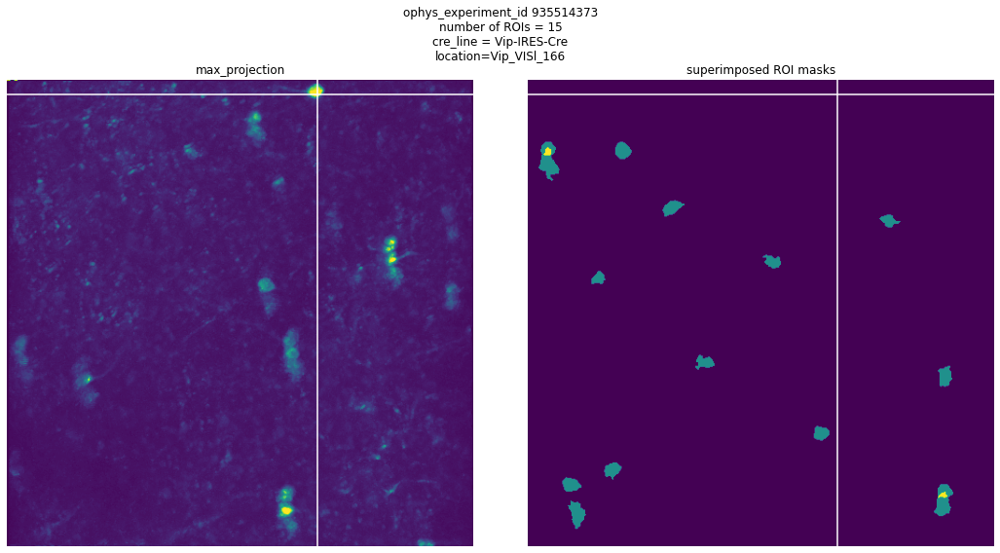

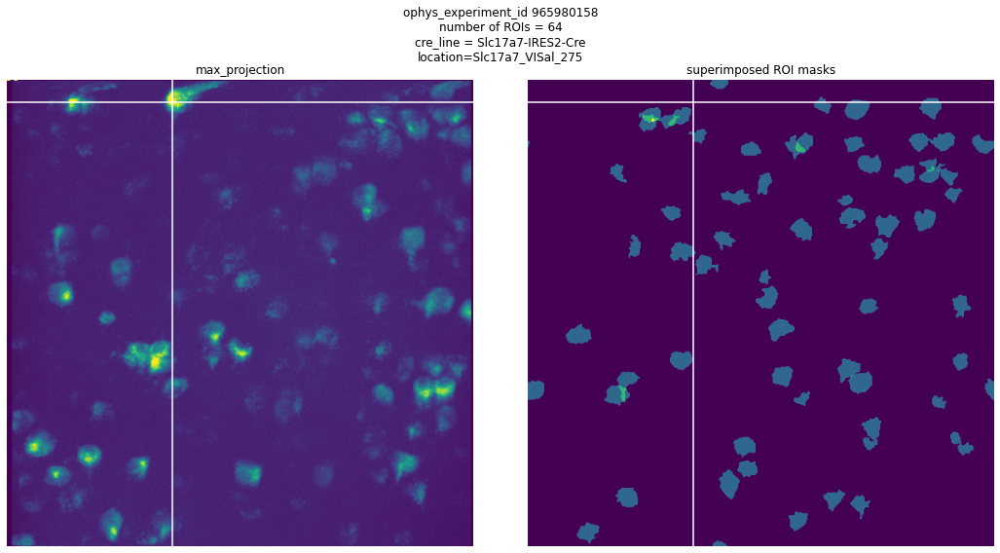

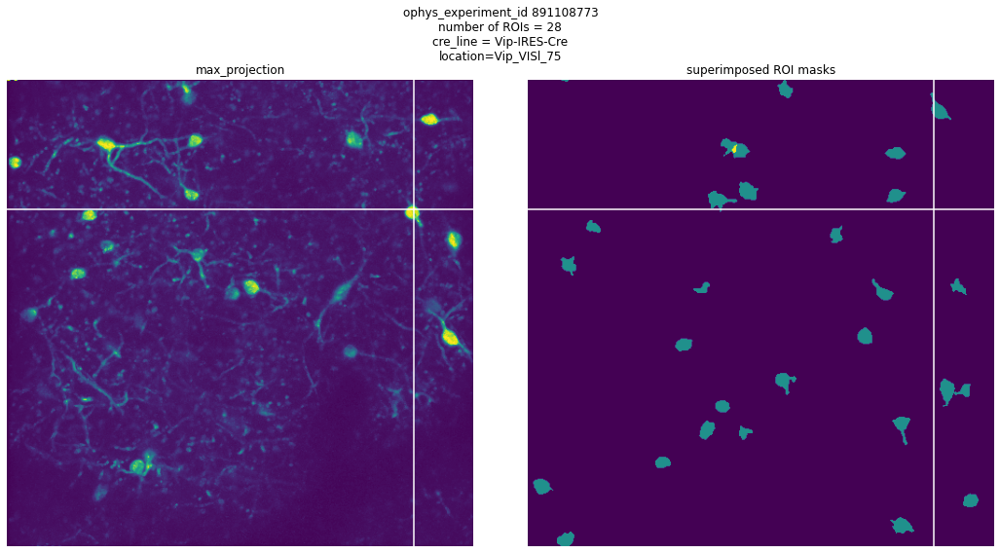

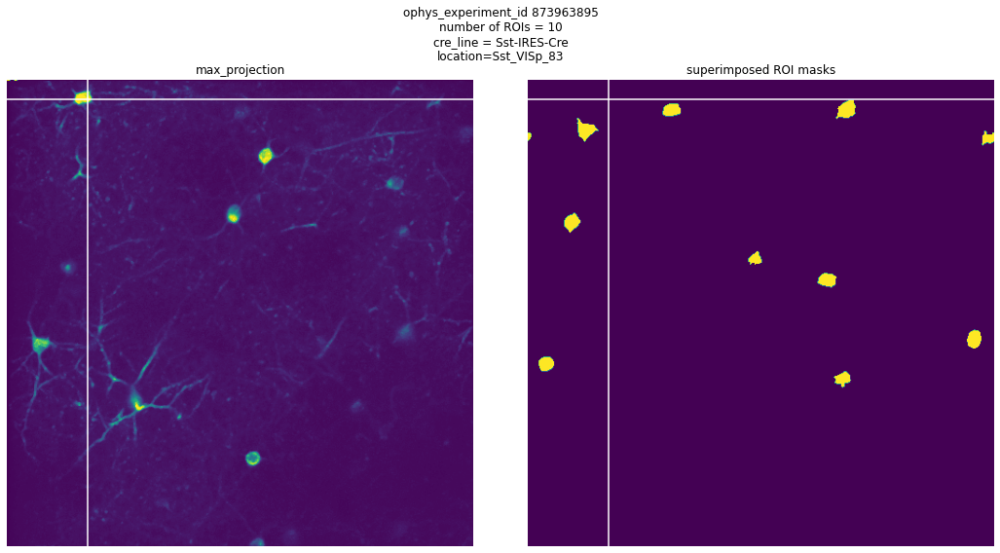

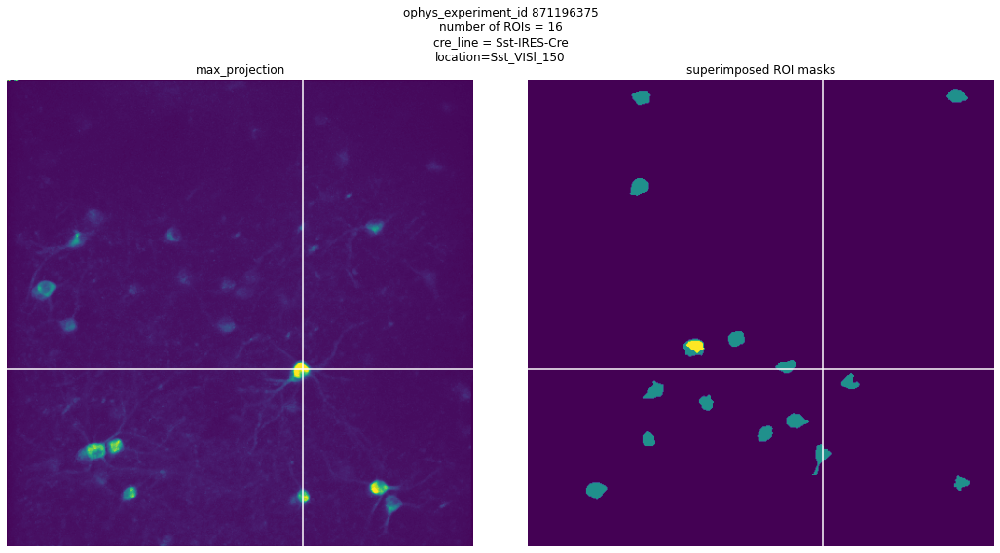

...

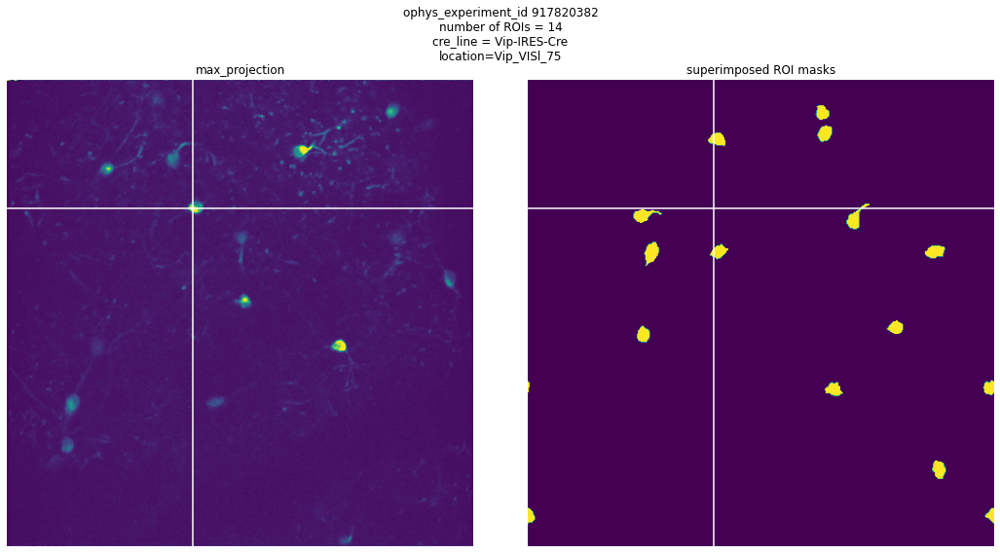

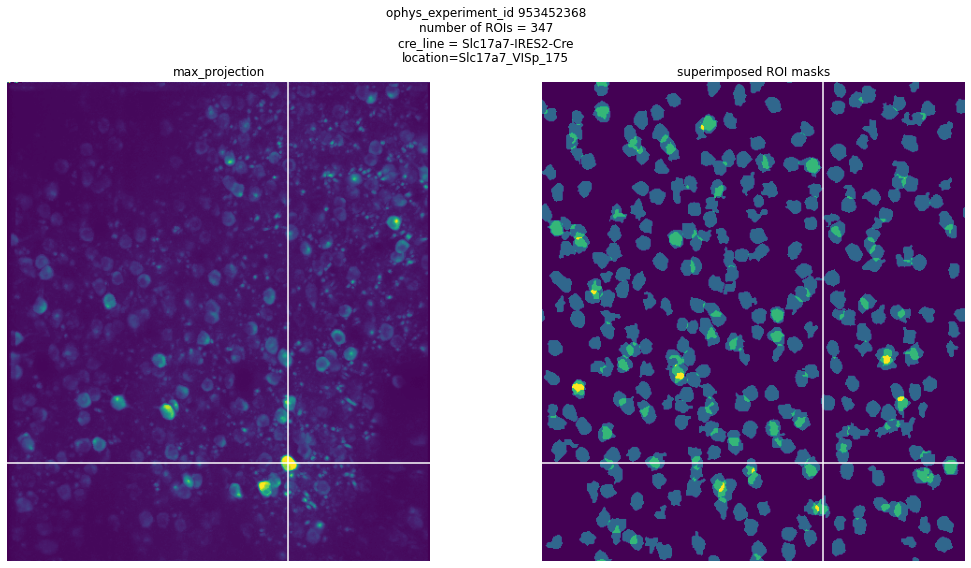

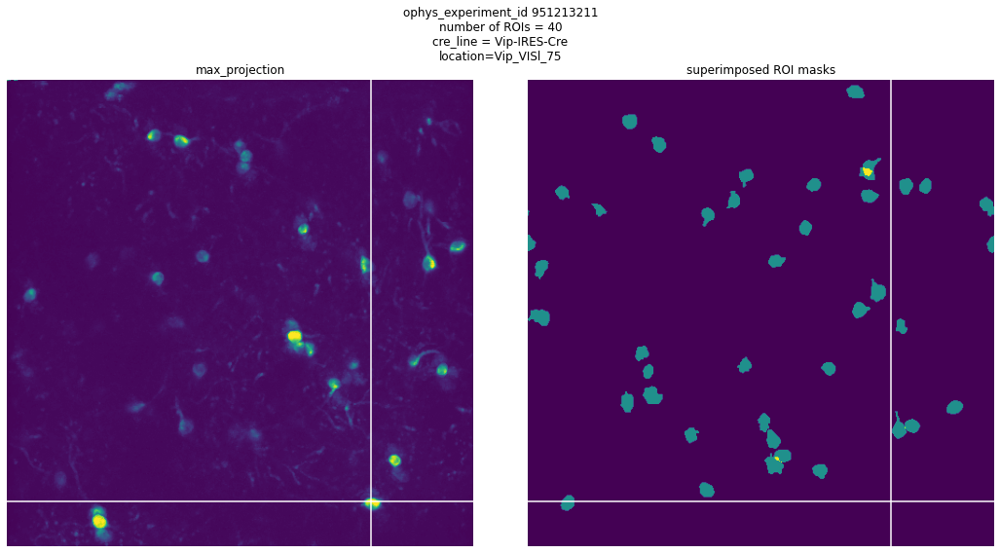

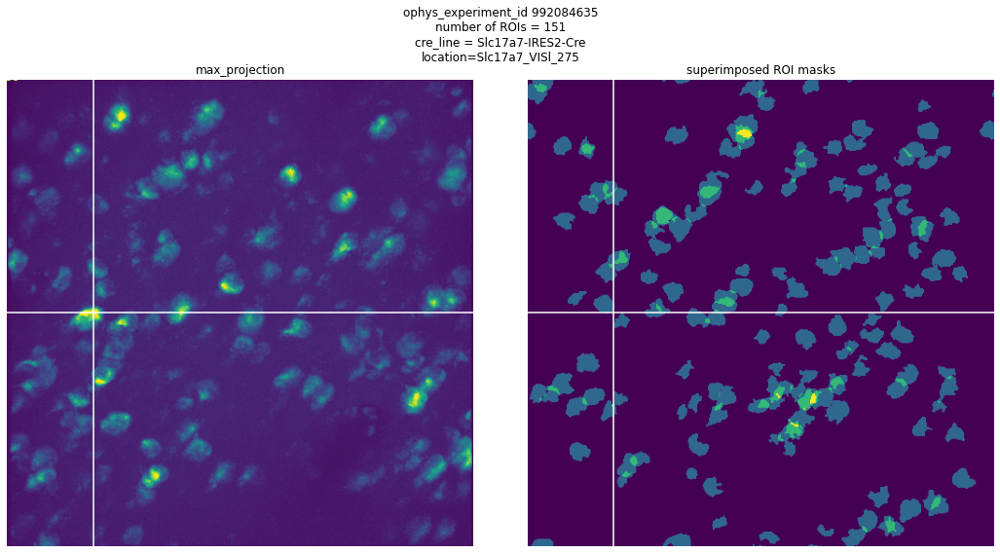

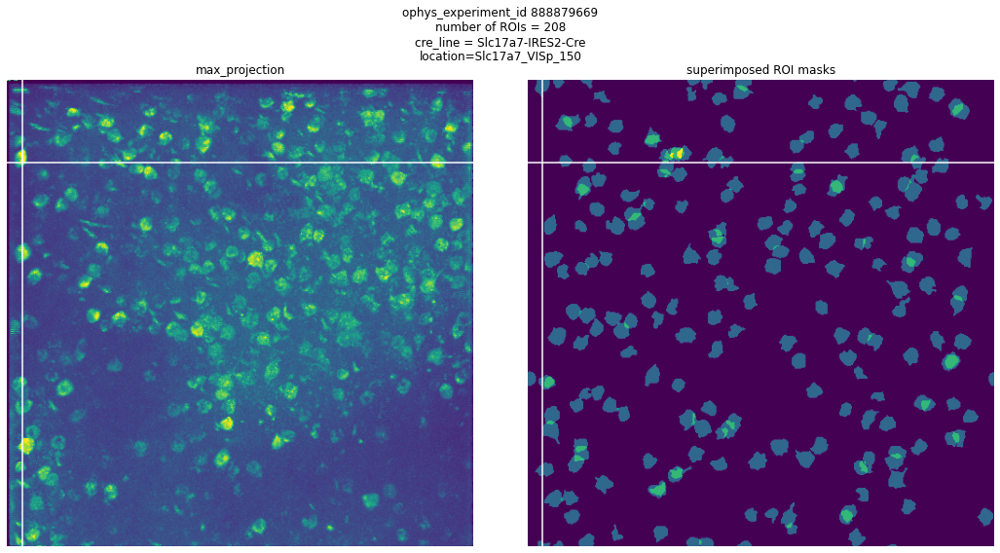

In [20]:
for idx,row in experiment_table.sample(30,random_state=0).iterrows():
    make_plots(row['ophys_experiment_id'], experiment_table)